### Setup

In [1]:
using Pkg

# Pkg.add(url="https://github.com/mppmu/BoostFractor.jl.git")
Pkg.add(url="https://github.com/bergermann/Dragoon.jl.git")
# Pkg.update()

    Updating git-repo `https://github.com/bergermann/Dragoon.jl.git`

   Resolving package versions...


  No Changes to `C:\Users\domin\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\domin\.julia\environments\v1.9\Manifest.toml`

In [2]:
using Dragoon
using Plots
# using Dates

In [3]:
#number of discs in the booster
n = 20

#initial disc configuration
#findpeak tries to find an equidistant configuration with a peak at f
initdist = findpeak(22.025e9,n)

#generate frequencies for calculation and for plotting
freqs = genFreqs(22.025e9,50e6; length=10) #optimize on these frequencies
freqsplot = genFreqs(22.025e9,150e6; length=1000)

#initialize physical properties of the booster
booster = AnalyticalBooster(initdist)
# booster.timestamp = DateTime(0)
#=
Booster(
    pos,              disc positions
    ndisk,            disc number
    thickness,        disc thickness
    epsilon,          disc epsilon
    vmotor,           motor speed
    maxlength,        maximum allowed booster length (not implemented yet)
    timestamp,        booster operation time
    summedtraveltime, summed motor operation time
    codetimestamp     code runtime
)
=#

#initialize storage of measurements
hist = initHist(booster,10000,freqs,ObjAnalytical)
#                           ^ length, should be at least the larger of (n^2, search steps)
;

Objective Value: -243.3, Timestamp: 0000-01-01T00:00:00


### Optimizer

In [4]:
#=
how to use

T = collect(range(100; length=1001,stop=0))

trace = simulatedAnnealing(booster,hist,freqs,
            T,100e-6,
            ObjAnalytical,
            UnstuckDont;
            maxiter=Int(1e6),
            showtrace=true,
            showevery=100,
            unstuckisiter=true,
            traceevery=100,
            resettimer=true)

returns trace, access with
trace[iteration].x      disc position
                .obj    objective value
                .g      gradient
                .h      hessian
                .t      timestamp
                .T      summed travel time
=#

In [5]:
T = collect(range(100; length=10001,stop=0))

trace = simulatedAnnealing(booster,hist,freqs,
            T,100e-6,
            ObjAnalytical,
            UnstuckDont;
            maxiter=Int(1e6),
            showtrace=true,
            showevery=1000,
            unstuckisiter=true,
            traceevery=1,
            resettimer=true)
;

Iter: 1000, timestamp: 4 minutes, 50 seconds
Iter finished. Objective value current:  -14768.604
               Objective value solution: -14779.336
               Temperature:              90.01



Iter: 2000, timestamp: 10 minutes, 14 seconds
Iter finished. Objective value current:  -14530.316
               Objective value solution: -14796.019
               Temperature:              80.01

Iter: 3000, timestamp: 15 minutes, 37 seconds
Iter finished. Objective value current:  -14737.69
               Objective value solution: -14796.019
               Temperature:              70.01



Iter: 4000, timestamp: 20 minutes, 56 seconds
Iter finished. Objective value current:  -14744.838
               Objective value solution: -14796.019
               Temperature:              60.01

Iter: 5000, timestamp: 26 minutes, 26 seconds
Iter finished. Objective value current:  -14705.694
               Objective value solution: -14796.019
               Temperature:              50.01



Iter: 6000, timestamp: 31 minutes, 45 seconds
Iter finished. Objective value current:  -14701.933
               Objective value solution: -14796.019
               Temperature:              40.01

Iter: 7000, timestamp: 37 minutes, 2 seconds
Iter finished. Objective value current:  -14605.288
               Objective value solution: -14796.019
               Temperature:              30.01



Iter: 8000, timestamp: 42 minutes, 26 seconds
Iter finished. Objective value current:  -14697.96
               Objective value solution: -14796.019
               Temperature:              20.01

Iter: 9000, timestamp: 47 minutes, 44 seconds
Iter finished. Objective value current:  -14700.788
               Objective value solution: -14796.019
               Temperature:              10.01



Iter: 10000, timestamp: 53 minutes, 3 seconds
Iter finished. Objective value current:  -14733.079
               Objective value solution: -14796.019
               Temperature:              0.01

Terminated. 10001 Iterations.
Final objective value: -14796.019
Elapsed movement time:  53 minutes, 4 seconds
Summed movement time:   7 hours, 53 minutes, 50 seconds
Elapsed computing time: 1 second, 57 milliseconds


In [6]:
#obtain result, booster is now in optimized position
#pos2dist(booster.pos)     #in distance space
booster.pos               #in position space

20-element Vector{Float64}:
 0.007046688821638218
 0.015283656311470339
 0.023341846394690946
 0.03169182195769764
 0.04010062008648581
 0.04812671680233736
 0.05644458449404984
 0.06470158586976416
 0.07282333676907145
 0.08105134187513452
 0.08940916639215467
 0.0975676359046977
 0.10568750367224032
 0.11402123805401071
 0.12224139763885244
 0.13043852163629108
 0.13870557983551768
 0.14686953963759017
 0.1547520085755799
 0.16295354475684873

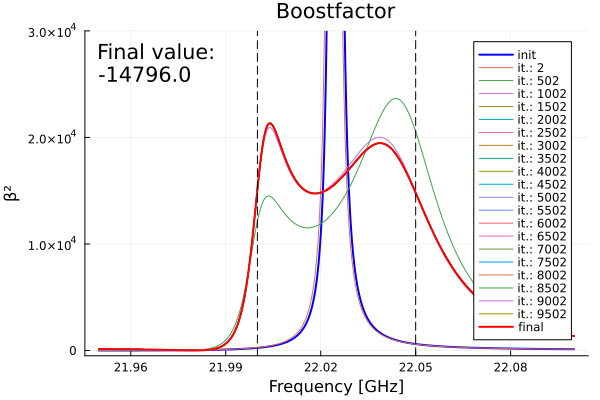

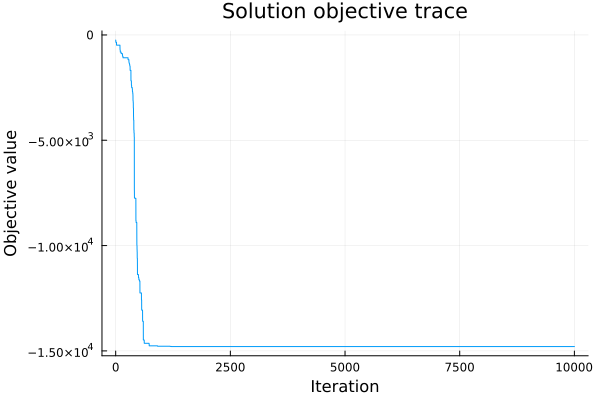

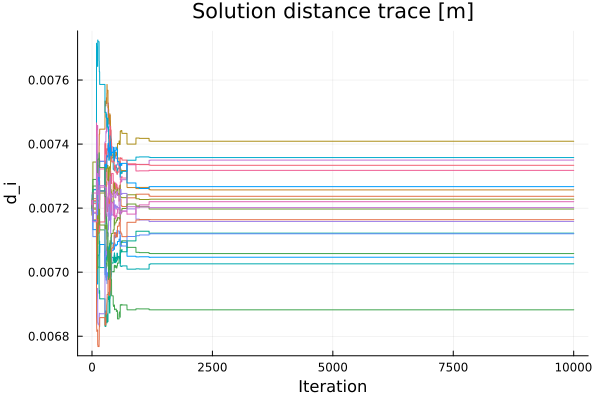

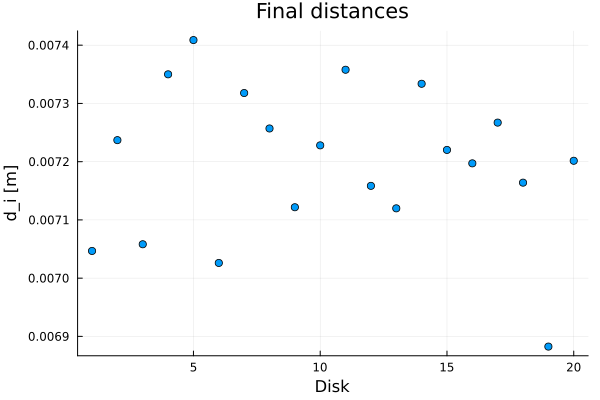

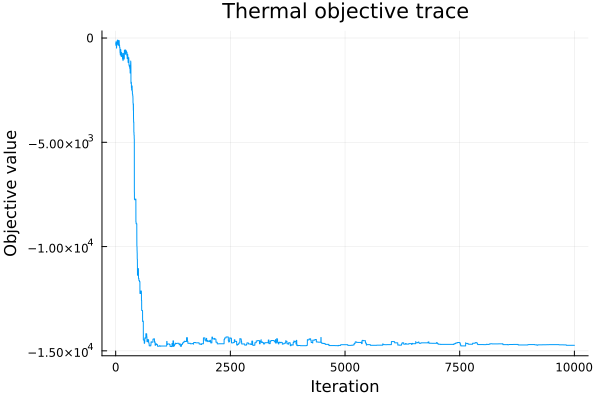

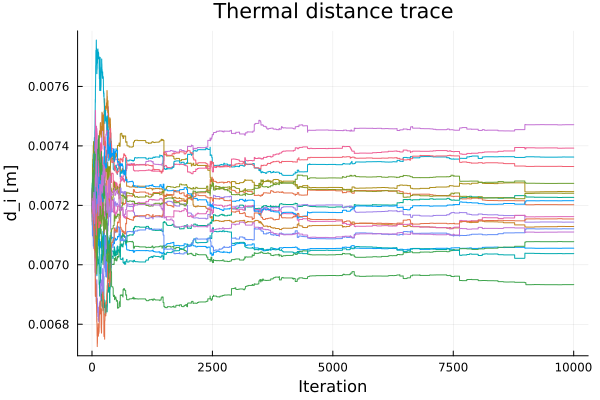

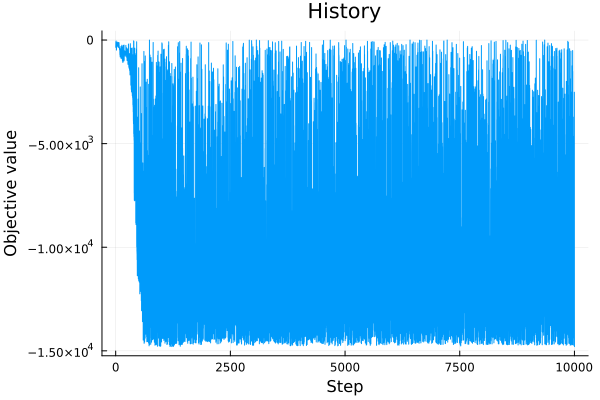

(Plot{Plots.GRBackend() n=23}, Plot{Plots.GRBackend() n=1}, Plot{Plots.GRBackend() n=20}, Plot{Plots.GRBackend() n=1}, Plot{Plots.GRBackend() n=1}, Plot{Plots.GRBackend() n=20}, Plot{Plots.GRBackend() n=1})

In [7]:
#get handy output
analyse(hist,trace[1:end-1],freqsplot; freqs=freqs,div=20,scale=1e9,ylim=[-0.05e4,3e4])

#savefig(plt[i],"cool_epic_result_wow.svg")

In [14]:
R = Dragoon.getRef1d(booster,genFreqs(22.025e9,50e6; length=50))
[println(r) for r in R]

0.9240607675676515 - 0.38224559885263165im
0.7380980822551304 - 0.674693427395952im
0.462948064022487 - 0.8863854071552547im
0.14786245633322903 - 0.9890079342488161im
-0.15586000240126052 - 0.9877791553031501im
-0.41490614421034666 - 0.9098642159665684im
-0.617404400711767 - 0.7866459216074747im
-0.7658156811116661 - 0.6430601391498648im
-0.8687939779605591 - 0.49517373098685186im
-0.9360561794775265 - 0.3518505774642497im
-0.9761192037376331 - 0.21723558662114203im
-0.9956895298891584 - 0.09274890872183986im
-0.9997664170139217 + 0.02161276037728511im
-0.9919648735330898 + 0.12651359482877816im
-0.9748503346892108 + 0.2228605504711954im
-0.9502174864493367 + 0.3115874330679862im
-0.9193032370696224 + 0.393549943861387im
-0.8829429833546631 + 0.46948023189991367im
-0.8416837189379979 + 0.5399708485415708im
-0.7958656259972035 + 0.6054732903737947im
-0.7456820601606868 + 0.6663019324259252im
-0.6912243153190141 + 0.7226402603728616im
-0.6325172274726643 + 0.7745462910312649im
-0.569547

50-element Vector{Nothing}:
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 ⋮
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing
 nothing

UndefVarError: UndefVarError: `ans` not defined